# Dependencies

In [ ]:
! pip install imagehash -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 105.4 MB/s eta 0:00:00


In [ ]:
!pip install neptune-tensorflow-keras neptune -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 502.6/502.6 kB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 108.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.2/84.2 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.8/144.8 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 5.6 MB/s eta 0:00:00


In [ ]:
!pip install python-dotenv -q

In [1]:
import os
#from dotenv import load_dotenv
import zipfile
from glob import glob
import shutil
import numpy as np
import datetime


import cv2
from PIL import Image

import matplotlib.pyplot as plt
import seaborn as sns

import hashlib
#from imagehash import phash
import random

import albumentations as A
from albumentations.pytorch import ToTensorV2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import load_model


from keras import backend as K
from keras.metrics import Precision, Recall

#import neptune
#from neptune.integrations.tensorflow_keras import NeptuneCallback

from sklearn.metrics import classification_report, confusion_matrix

random.seed(42)  # Set a fixed seed for reproducibility


In [ ]:
load_dotenv()
NEPTUNE_API_TOKEN = os.getenv("NEPTUNE_API_TOKEN")


# load and view

In [ ]:
#shutil.rmtree("./dataset")

In [6]:
# __________extract the files from the zip file_____

zip_file = r"/content/Teeth DataSet.zip"
with zipfile.ZipFile(zip_file, 'r') as z:
    z.extractall("./dataset")

In [7]:
# extract the sub directory from testing

data_dir = "./dataset/Teeth_Dataset"

training = os.path.join(data_dir, "Training")
validation = os.path.join(data_dir, "Validation")
testing = os.path.join(data_dir, "Testing")


os.mkdir("./dataset/Teeth_Dataset/Testing_edit")
for sub_dir in os.listdir(testing):
  if sub_dir in os.listdir(training):
      src = os.path.join(testing, sub_dir)
      dest = os.path.join("./dataset/Teeth_Dataset/Testing_edit", sub_dir)

      if os.path.isdir(src):
          # Copy the entire subdirectory to 'Testing_edit'
          shutil.copytree(src, dest)

testing = "./dataset/Teeth_Dataset/Testing_edit"

In [ ]:


subsets = ["Testing", "Validation", "Training"]
classes = os.listdir(os.path.join(data_dir, "Training"))

num_samples = {subset: {cls: 0 for cls in classes} for subset in subsets}

for subset in subsets:
    subset_path = os.path.join(data_dir, subset)
    for cls in classes:
        class_path = os.path.join(subset_path, cls)
        if os.path.isdir(class_path):
            num_samples[subset][cls] = len(os.listdir(class_path))



In [ ]:
for dir in os.listdir(data_dir):
  num_sample = glob(f'./dataset/Teeth_Dataset/{dir}/*/*.jpg')
  print(f"{dir} : {len(num_sample)}")


Testing : 1508
Training : 3087
Validation : 1028


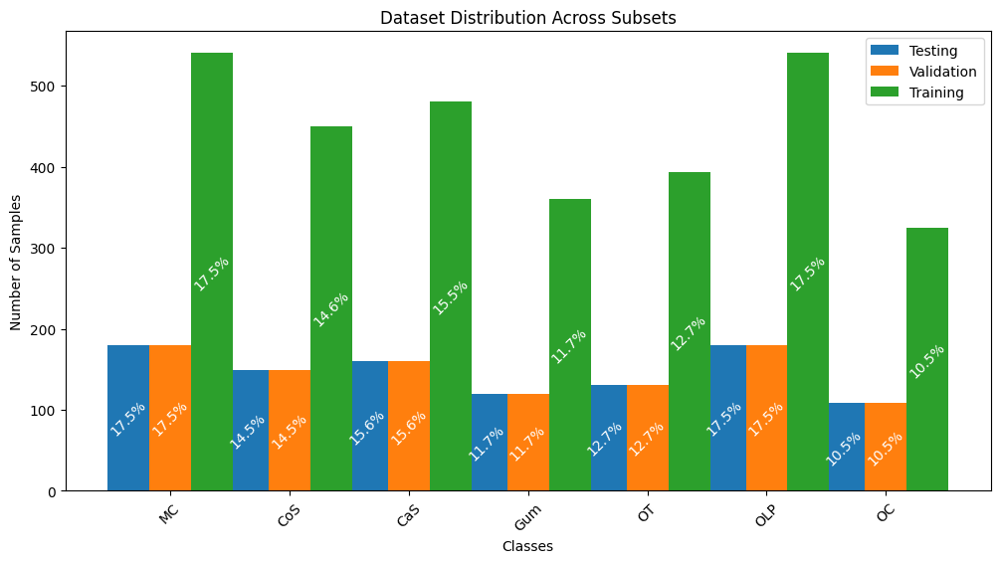

In [ ]:

class_labels = list(classes)
subset_labels = subsets

data = np.array([[num_samples[subset][cls] for cls in class_labels] for subset in subsets])
total_samples = {subset: sum(num_samples[subset].values()) for subset in subsets}

x = np.arange(len(class_labels))
width = 0.35  # Width of bars

fig, ax = plt.subplots(figsize=(12, 6))
for i, subset in enumerate(subsets):
    bars = ax.bar(x + i * width, data[i], width, label=subset)

    for bar, cls in zip(bars, class_labels):
        if total_samples[subset] > 0:  # Avoid division by zero
            percentage = (num_samples[subset][cls] / total_samples[subset]) * 100
            ax.text(bar.get_x() + bar.get_width() / 2,
                    bar.get_height() / 2,  # Position inside the bar
                    f"{percentage:.1f}%",
                    ha='center', va='center', fontsize=10, color='white', rotation=45)  # Rotated text inside bars

ax.set_xlabel("Classes")
ax.set_ylabel("Number of Samples")
ax.set_title("Dataset Distribution Across Subsets")
ax.set_xticks(x + width)
ax.set_xticklabels(class_labels, rotation=45)
ax.legend()

plt.show()


add percentage on bar to verify balance

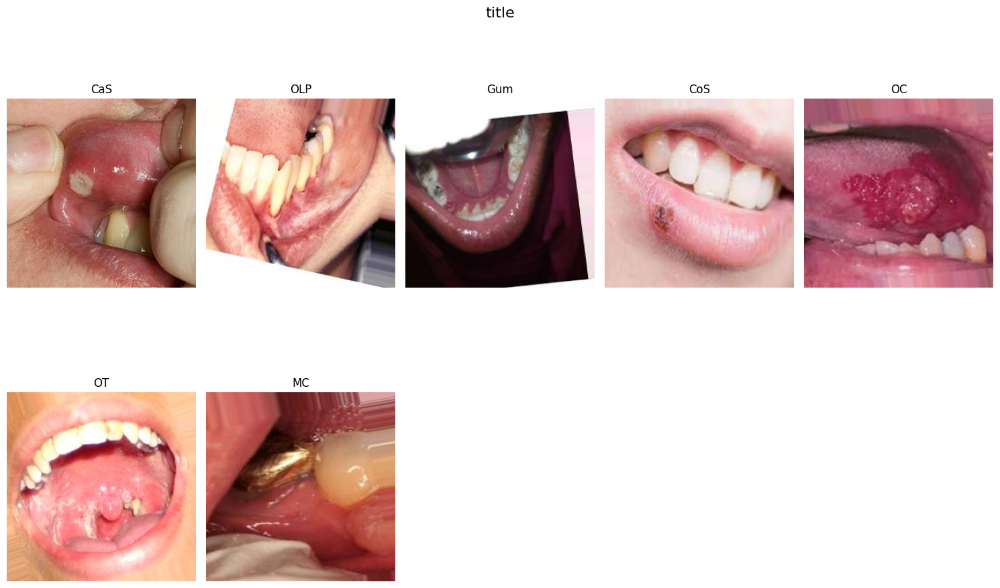

In [ ]:
def view_sample_images(image_directory, pipeline=None, title: str ="Sample Image"):
    # List all subdirectories (classes)
    classes = [d for d in os.listdir(image_directory) if os.path.isdir(os.path.join(image_directory, d))]

    plt.figure(figsize=(15, 10))
    plt.suptitle("title", fontsize=16)  # Title for the figure

    for i, cls in enumerate(classes):
        # Get the first image in each subdirectory
        class_path = os.path.join(image_directory, cls)
        image_files = [f for f in os.listdir(class_path)]

        image_path = os.path.join(class_path, image_files[0])
        image = Image.open(image_path)

        # Apply pipeline if provided
        if pipeline:
            augmented = pipeline(image=image)
            image = augmented["image"]

        plt.subplot(2, 5, i + 1)  # Adjust grid size based on number of classes
        plt.imshow(image)
        plt.title(cls)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

view_sample_images(training)


In [ ]:
image = Image.open(r"/content/dataset/Teeth_Dataset/Training/MC/mc_1200.jpg")
print(f"image size = {image.size}")

image size = (256, 256)


# Preprocessing

In [ ]:
def remove_corrupted_and_duplicates(image_directory, use_phash=True, hash_threshold=15):

    global removed_files, corrupted_files, num_duplicate, valid_files, pairs

    for root, _, files in os.walk(image_directory):
        print(f"Processing directory: {root}")
        for file_name in files:
            file_path = os.path.join(root, file_name)
            try:
                # Check if the image is corrupted
                with Image.open(file_path) as img:
                    img.verify()

                # Compute hash based on the selected method
                if use_phash:
                    with Image.open(file_path) as img:
                        img_hash = phash(img)
                else:
                    with open(file_path, 'rb') as f:
                        img_hash = hashlib.md5(f.read()).hexdigest()

                # Check for duplicates based on hash similarity
                is_duplicate = False
                for h, path in file_hashes.items():
                    if use_phash:
                        if img_hash - h <= hash_threshold:  # Hamming distance comparison
                            is_duplicate = True
                            break
                    else:
                        if img_hash == h:  # Exact match for MD5
                            is_duplicate = True
                            break

                if is_duplicate:
                    new_path = os.path.join("./unvalid", file_name)
                    shutil.move(file_path, new_path)
                    pairs.append((path, new_path))
                    removed_files += 1
                    num_duplicate += 1
                else:
                    file_hashes[img_hash] = file_path

            except (IOError, SyntaxError):
                shutil.move(file_path, os.path.join("./unvalid", file_name))
                removed_files += 1
                corrupted_files += 1
                corrupted_files.append(file_path)
                print(f"Removed corrupted image: {file_name}")

    print(f"Removed {removed_files} corrupted or duplicate images.")
    print(f"Number of corrupted images removed: {corrupted_files}")
    print(f"Number of duplicate images removed: {num_duplicate}")

os.mkdir("./unvalid")
subset = ['Training', 'Validation', 'Testing_edit']

file_hashes = {}
removed_files = 0
corrupted_files = 0
num_duplicate = 0
pairs=[]

for s in subset:
  remove_corrupted_and_duplicates(image_directory=os.path.join(data_dir, s),
                                  use_phash=False)


Processing directory: ./dataset/Teeth_Dataset/Training
Processing directory: ./dataset/Teeth_Dataset/Training/OC
Processing directory: ./dataset/Teeth_Dataset/Training/OLP
Processing directory: ./dataset/Teeth_Dataset/Training/CaS
Processing directory: ./dataset/Teeth_Dataset/Training/Gum
Processing directory: ./dataset/Teeth_Dataset/Training/MC
Processing directory: ./dataset/Teeth_Dataset/Training/OT
Processing directory: ./dataset/Teeth_Dataset/Training/CoS
Removed 12 corrupted or duplicate images.
Number of corrupted images removed: 0
Number of duplicate images removed: 12
Processing directory: ./dataset/Teeth_Dataset/Validation
Processing directory: ./dataset/Teeth_Dataset/Validation/OC
Processing directory: ./dataset/Teeth_Dataset/Validation/OLP
Processing directory: ./dataset/Teeth_Dataset/Validation/CaS
Processing directory: ./dataset/Teeth_Dataset/Validation/Gum
Processing directory: ./dataset/Teeth_Dataset/Validation/MC
Processing directory: ./dataset/Teeth_Dataset/Validation

./dataset/Teeth_Dataset/Training/OLP/p_1221_0_7963.jpg ./unvalid/a_155_0_9752.jpg
./dataset/Teeth_Dataset/Validation/OT/ot_1251_0_2191.jpg ./unvalid/b_128_0_9415.jpg
./dataset/Teeth_Dataset/Training/OLP/p_1274_0_1039.jpg ./unvalid/p_1274_0_392.jpg
./dataset/Teeth_Dataset/Training/OLP/p_1222_0_8218.jpg ./unvalid/p_1222_0_1081.jpg
./dataset/Teeth_Dataset/Training/OLP/p_1202_0_4010.jpg ./unvalid/p_1202_0_4529.jpg
./dataset/Teeth_Dataset/Training/CaS/a_96_0_2129.jpg ./unvalid/a_103.jpg
./dataset/Teeth_Dataset/Training/MC/mc_1235_0_9920.jpg ./unvalid/mc_1200_0_1878.jpg
./dataset/Teeth_Dataset/Training/OC/oc_1207_0_8127.jpg ./unvalid/ot_1238_0_5353.jpg
./dataset/Teeth_Dataset/Training/MC/mc_1259_0_6737.jpg ./unvalid/mc_1215_0_3526.jpg
./dataset/Teeth_Dataset/Training/CoS/b_139_0_8332.jpg ./unvalid/b_139_0_3355.jpg
./dataset/Teeth_Dataset/Training/OC/oc_1242_0_3854.jpg ./unvalid/oc_1242.jpg
./dataset/Teeth_Dataset/Training/OT/ot_1260_0_3645.jpg ./unvalid/ot_1213_0_8509.jpg


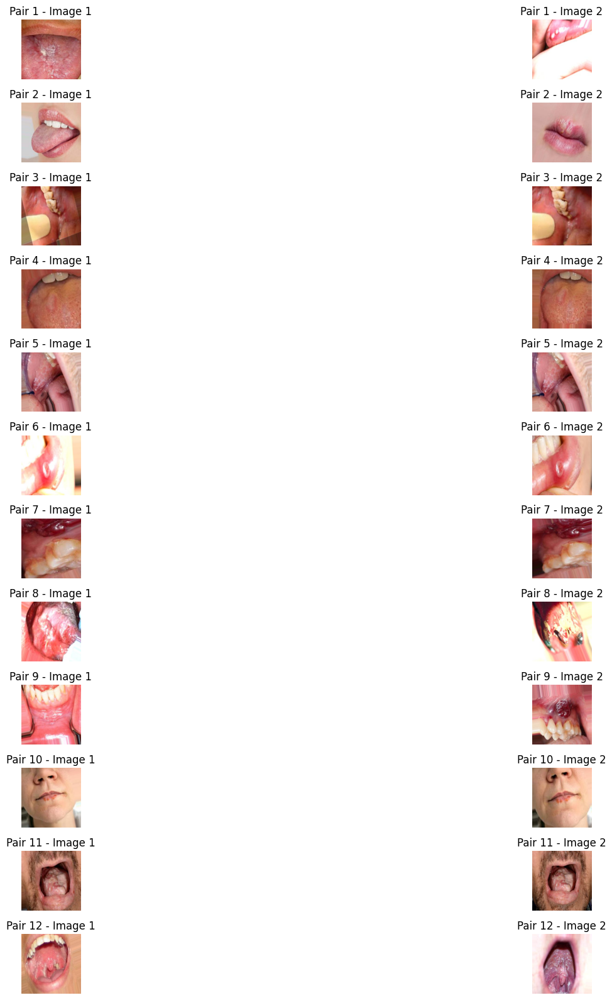

In [ ]:
# plot sample of the duplicate images

# number of pairs we want to view it
NUM_PAIRS = 12

selected_pairs = random.sample(pairs, NUM_PAIRS)
fig, axes = plt.subplots(nrows=NUM_PAIRS, ncols=2, figsize=(24, 16))

for i, (img1_path, img2_path) in enumerate(selected_pairs):
    print(img1_path, img2_path)
    img1 = Image.open(img1_path)
    img2 = Image.open(img2_path)

    axes[i, 0].imshow(img1)
    axes[i, 0].axis("off")  # Hide axis
    axes[i, 0].set_title(f"Pair {i+1} - Image 1")

    axes[i, 1].imshow(img2)
    axes[i, 1].axis("off")  # Hide axis
    axes[i, 1].set_title(f"Pair {i+1} - Image 2")

plt.tight_layout()
plt.show()


task:
imporove the complexity for the hashing mechanism and remove the files form testing and validation only

# Augmentation




*   translation
*   flipping
*   lightness
*   rotation



do we need to apply normalization

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:58: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


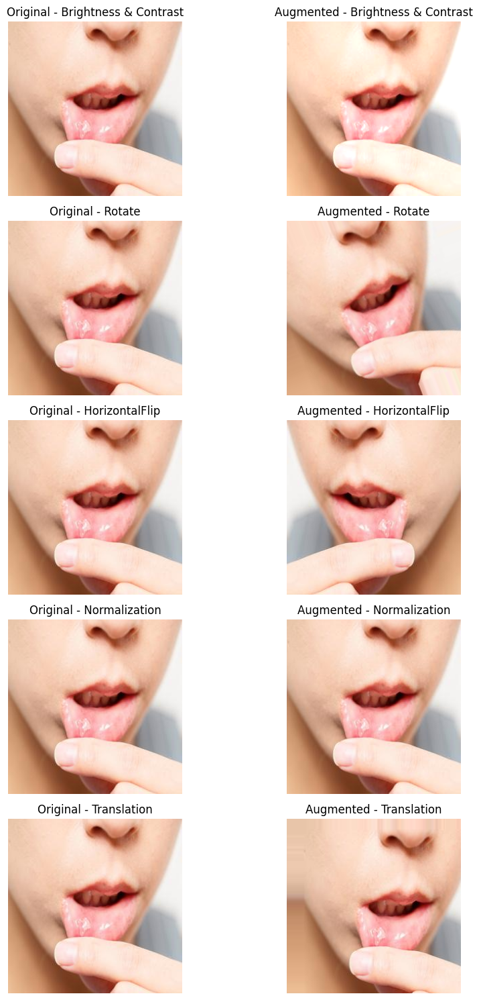

In [ ]:
# visualize the effect of each augmentation tecnique

# Define transformations
transforms = [
    (A.RandomBrightnessContrast(brightness_limit=(0, 0.2), p=1.0), 'Brightness & Contrast'),
    (A.Rotate(limit=(20, 45), p=1.0, border_mode=cv2.BORDER_REPLICATE), 'Rotate'),
    (A.HorizontalFlip(p=1.0), "HorizontalFlip"),
    (A.Normalize(mean=[0.0, 0.0, 0.0], std=[1.0, 1.0, 1.0], p=1.0), 'Normalization'),
    (A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0, rotate_limit=0,border_mode=cv2.BORDER_REPLICATE, p=1), "Translation")  # Apply horizontal/vertical shift

]

# Read the image
image_path = "/content/dataset/Teeth_Dataset/Testing/CaS/a_100.jpg"
image = Image.open(image_path)
image = np.array(image)
# Plot results
fig, axes = plt.subplots(len(transforms), 2, figsize=(10, 3 * len(transforms)))

for i, (transform, title) in enumerate(transforms):
    # Original Image
    axes[i, 0].imshow(image)
    axes[i, 0].set_title(f'Original - {title}')
    axes[i, 0].axis('off')

    # Augmented Image
    augmented = A.Compose([transform, ToTensorV2()])(image=image)
    aug_image = augmented['image'].permute(1, 2, 0).cpu().numpy()
    axes[i, 1].imshow(aug_image)
    axes[i, 1].set_title(f'Augmented - {title}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


In [ ]:

# def compute_class_weights(image_counts):
#     inverse_weights = {cls: 1 / count for cls, count in image_counts.items()}
#     total_weight = sum(inverse_weights.values())
#     normalized_weights = {cls: w / total_weight for cls, w in inverse_weights.items()}
#     return normalized_weights

In [ ]:

def get_augmentation_pipeline():
    return A.Compose([
    A.RandomBrightnessContrast(brightness_limit=(0, 0.2), p=0.01),
    A.Rotate(limit=(20, 55), p=0.15, border_mode=cv2.BORDER_REPLICATE),  # Albumentations border_mode=5 is BORDER_REFLECT_101
    A.HorizontalFlip(p=0.2),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0, rotate_limit=0,border_mode=cv2.BORDER_REPLICATE, p=0.1),
])


def save_augmented_image(image, output_dir, class_name, image_name, augmentation_pipeline):
    augmented = augmentation_pipeline(image=image)  # Apply augmentation
    augmented_image = augmented['image']  # Extract augmented image

    augmented_image_path = os.path.join(output_dir, class_name, f"aug_{image_name}")
    augmented_pil = Image.fromarray(augmented_image)
    if augmented_pil.mode == 'RGBA':  # If it has an alpha channel
      augmented_pil.show(title="Before Conversion")
      augmented_pil = augmented_pil.convert('RGB')  # Convert to RGB
      augmented_pil.show(title="After Conversion")
    augmented_pil.save(augmented_image_path)

def augment_and_save_dataset(input_dir, output_dir, augmentation_pipeline, augment_fraction=0.25):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # #  Distribute augmentation quota based on class weights
    # classes_weight = compute_class_weights(num_samples['Training'])
    # total_images = total_samples['Training']
    # total_augment_images = int(total_images * augment_fraction)
    # class_augment_counts = {cls: int(total_augment_images * classes_weight[cls]) for cls in num_samples['Training']}


    for class_name in os.listdir(input_dir):
        class_dir = os.path.join(input_dir, class_name)
        if not os.path.isdir(class_dir):
            continue

        output_class_dir = os.path.join(output_dir, class_name)
        if not os.path.exists(output_class_dir):
            os.makedirs(output_class_dir)

        image_files = os.listdir(class_dir)
        num_to_augment = int(len(image_files) * augment_fraction)
        images_to_augment = random.sample(image_files, min(num_to_augment, len(image_files)))

        for image_name in image_files:
            image_path = os.path.join(class_dir, image_name)
            image = Image.open(image_path)
            image_np = np.array(image)

            original_image_path = os.path.join(output_class_dir, image_name)
            shutil.copy(image_path, original_image_path)


            if image_name in images_to_augment:
                save_augmented_image(image_np, output_dir, class_name, image_name, augmentation_pipeline)


input_dir = "/content/dataset/Teeth_Dataset/Training"
output_dir = "./dataset/Teeth_Dataset/augm/train"

augmentation_pipeline = get_augmentation_pipeline()
augment_and_save_dataset(input_dir, output_dir, augmentation_pipeline)

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:58: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(

    rescale=1/255.,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range= 0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
val_datagen = ImageDataGenerator(
    rescale=1/255.
)

In [ ]:
# Define image parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32


train_generator = train_datagen.flow_from_directory(
        TRAIN_DIR,
        target_size = IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
        VAL_DIR,
        target_size = IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical'
)

Found 3087 images belonging to 7 classes.
Found 1028 images belonging to 7 classes.


In [11]:
# reinitiae the subset since already we edit on them

#AUG_DIR = "./dataset/Teeth_Dataset/augm/train"
TRAIN_DIR = "/content/dataset/Teeth_Dataset/Training"
VAL_DIR = "/content/dataset/Teeth_Dataset/Validation"
TEST_DIR = "/content/dataset/Teeth_Dataset/Testing_edit"

# aug = glob(f"{AUG_DIR}/*/*.jpg")
# train = glob("./dataset/Teeth_Dataset/Training/*/*")
# len(train), len(aug)

In [ ]:
image_counts_aug = {}
for class_name in os.listdir(AUG_DIR):
        class_dir = os.path.join(AUG_DIR, class_name)
        if os.path.isdir(class_dir):
            image_counts_aug[class_name] = len(os.listdir(class_dir))


In [ ]:
num_samples['Training']

{'MC': 540,
 'CoS': 450,
 'CaS': 480,
 'Gum': 360,
 'OT': 393,
 'OLP': 540,
 'OC': 324}

In [ ]:
image_counts_aug

{'MC': 672,
 'CoS': 561,
 'CaS': 598,
 'Gum': 450,
 'OT': 491,
 'OLP': 667,
 'OC': 402}

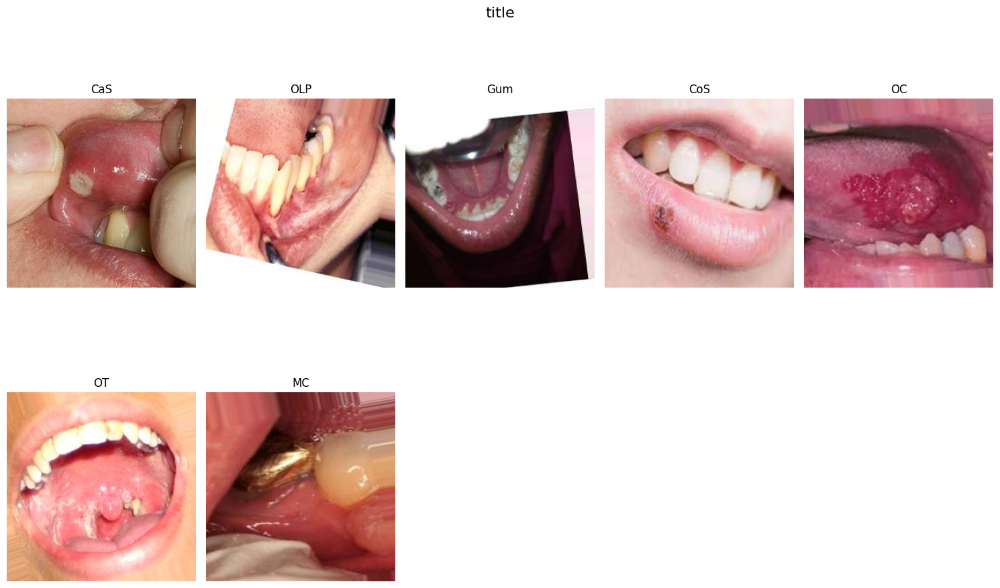

In [ ]:
view_sample_images(AUG_DIR)


# prepare the data

In [12]:

IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32

def create_datasets(train_dir, val_dir, test_dir, img_height, img_width, batch_size):
    normalization_layer = layers.Rescaling(1./255.0)

    train_ds = tf.keras.utils.image_dataset_from_directory(
        train_dir, image_size=(img_height, img_width), batch_size=batch_size, shuffle=True
    )#.map(lambda x, y: (normalization_layer(x), y))
    class_name = train_ds.class_names
    train_ds = train_ds.map(lambda x, y: (normalization_layer(x), tf.one_hot(y, len(class_name))))
    val_ds = tf.keras.utils.image_dataset_from_directory(
        val_dir, image_size=(img_height, img_width), batch_size=batch_size
    ).map(lambda x, y: (normalization_layer(x), tf.one_hot(y, len(class_name))))

    test_ds = tf.keras.utils.image_dataset_from_directory(
        test_dir, image_size=(img_height, img_width), batch_size=batch_size
    ).map(lambda x, y: (normalization_layer(x),tf.one_hot(y, len(class_name))))

    train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
    test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
    return  train_ds, val_ds, test_ds, class_name

train_ds, val_ds, test_ds, classes_name = create_datasets(TRAIN_DIR ,VAL_DIR, TEST_DIR, IMG_HEIGHT, IMG_WIDTH, BATCH_SIZE)

Found 3087 files belonging to 7 classes.
Found 1028 files belonging to 7 classes.
Found 1028 files belonging to 7 classes.


In [ ]:
# Ensure that the dataset yields a tuple (input_data, labels)
(input_data, labels) = next(iter(val_ds))
print(input_data.shape, labels.shape)


(32, 224, 224, 3) (32, 7)


In [ ]:
# Ensure that the dataset yields a tuple (input_data, labels)
(input_data, labels) = next(iter(train_ds))
print(input_data.shape, labels.shape)


(32, 224, 224, 3) (32, 7)


In [ ]:
print(f"Train dataset shape: {train_ds.element_spec}")
print(f"Validation dataset shape: {val_ds.element_spec}")


Train dataset shape: (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))
Validation dataset shape: (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))


# model building

In [ ]:
def callbacks(tags: str, checkpoint_file_name: str):
    global run
    # tensorbord
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1, write_graph=True)

    # experiment tracking

    run = neptune.init_run(
        project="rahma-esam/oral-lesions",
        api_token=NEPTUNE_API_TOKEN,
        tags=[tags]
        )

    neptune_callback = NeptuneCallback(run=run)

    # early stopping
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',  # The metric to monitor (could be 'val_accuracy' or 'val_loss')
        patience=5,          # Number of epochs to wait for improvement
        restore_best_weights=True  # Restore model weights from the best epoch
    )

    # lr_scheduler
    lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.4, patience=3)

    # ModelCheckpoint: Save the model after every epoch.
    checkpoint = tf.keras.callbacks.ModelCheckpoint(
        f'{checkpoint_file_name}.weights.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True
    )


    return early_stopping, checkpoint, lr_scheduler, neptune_callback, tensorboard_callback




In [9]:
class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name='f1', average='micro', **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.precision = Precision()
        self.recall = Recall()
        self.average = average

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        precision = self.precision.result()
        recall = self.recall.result()
        f1 = 2 * (precision * recall) / (precision + recall + K.epsilon())
        return f1

    def reset_states(self):
        self.precision.reset_states()
        self.recall.reset_states()



In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

class SqueezeExcite(layers.Layer):
    def __init__(self, ratio=16, **kwargs):
        super(SqueezeExcite, self).__init__(**kwargs)
        self.ratio = ratio

    def build(self, input_shape):
        filters = input_shape[-1]
        self.global_avg_pool = layers.GlobalAveragePooling2D()
        self.dense1 = layers.Dense(filters // self.ratio, activation='relu', use_bias=False)
        self.dense2 = layers.Dense(filters, activation='sigmoid', use_bias=False)
        self.reshape = layers.Reshape((1, 1, filters))

    def call(self, inputs, training=False):
        se = self.global_avg_pool(inputs)
        se = self.dense1(se)
        se = self.dense2(se)
        se = self.reshape(se)
        return layers.multiply([inputs, se])

input_shape = (224, 224, 3)

model = keras.Sequential([
    layers.Conv2D(128, (3,3), padding='same', input_shape=input_shape,
                  kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    SqueezeExcite(16),  # SE Block
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2,2), strides=2),
    layers.Dropout(0.4),

    layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    SqueezeExcite(16),  # SE Block
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2,2), strides=2),
    layers.Dropout(0.3),

    layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    SqueezeExcite(16),  # SE Block
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.2),

    layers.Flatten(),
    layers.Dense(64),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dense(7, activation='softmax')  # 7 classes
])

model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)                   │ (None, 224, 224, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ squeeze_excite_12 (SqueezeExcite)    │ (None, 224, 224, 128)       │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 224, 224, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_8 (Activation)            │ (None, 224, 224, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 112, 112, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 112, 112, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 112, 112, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ squeeze_excite_13 (SqueezeExcite)    │ (None, 112, 112, 64)        │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_9 (Activation)            │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 56, 56, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ squeeze_excite_14 (SqueezeExcite)    │ (None, 56, 56, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 56, 56, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_10 (Activation)           │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 64)                  │       6,422,592 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 64)                  │             2

 Total params: 6,522,727 (24.88 MB)

 Trainable params: 6,522,151 (24.88 MB)

 Non-trainable params: 576 (2.25 KB)

In [ ]:

# Now, use this custom F1Score metric in your model compilation
model.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=[F1Score(name="f1", average="micro"), 'accuracy'])

In [ ]:
print(tf.config.list_logical_devices())


[LogicalDevice(name='/device:CPU:0', device_type='CPU'), LogicalDevice(name='/device:GPU:0', device_type='GPU')]


In [ ]:
history = model.fit(
    train_generator,
    epochs=32,
    validation_data=val_generator,
    callbacks=[early_stopping, checkpoint, lr_scheduler, neptune_callback]
)

run.stop()

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 62s 508ms/step - accuracy: 0.2437 - f1: 0.0660 - loss: 3.1382 - val_accuracy: 0.1449 - val_f1: 0.0000e+00 - val_loss: 2.7227 - learning_rate: 0.0010
Epoch 2/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 43s 444ms/step - accuracy: 0.3753 - f1: 0.1780 - loss: 2.1465 - val_accuracy: 0.1449 - val_f1: 0.1665 - val_loss: 2.6128 - learning_rate: 0.0010
Epoch 3/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 42s 436ms/step - accuracy: 0.4383 - f1: 0.2760 - loss: 1.7455 - val_accuracy: 0.2014 - val_f1: 0.1490 - val_loss: 2.2638 - learning_rate: 0.0010
Epoch 4/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 424ms/step - accuracy: 0.4867 - f1: 0.3437 - loss: 1.5435 - val_accuracy: 0.2597 - val_f1: 0.2094 - val_loss: 2.1936 - learning_rate: 0.0010
Epoch 5/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 424ms/step - accuracy: 0.4951 - f1: 0.3641 - loss: 1.4972 - val_accuracy: 0.2412 - val_f1: 0.2279 - val_loss: 2.0917 - learning_rate: 0.0010
Epoch 6/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 43s 440ms/step - accuracy: 0.5534 - f1: 0.4

task:
create custom loss

# pretrained model

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, Flatten, Dropout, Conv2D, BatchNormalization, GlobalAveragePooling2D, ReLU
from tensorflow.keras.models import Model

# Load pretrained DenseNet121 (without top layers)
base_model = DenseNet121(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers
base_model.trainable = False

# Add custom layers to deepen the model
x = base_model.output

# Adding additional convolutional layers for more depth
x = Conv2D(32, (3, 3),  padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = Conv2D(64, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)

# Use Global Average Pooling to reduce spatial dimensions before fully connected layers
x = GlobalAveragePooling2D()(x)

# Add a Dense layer and Dropout for regularization
x = Dense(128)(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = Dropout(0.5)(x)

# Output layer for classification (7 classes)
x = Dense(7, activation='softmax')(x)

# Create final model
model = Model(inputs=base_model.input, outputs=x)

# Summary
model.summary()


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,361,063 (28.08 MB)

 Trainable params: 323,111 (1.23 MB)

 Non-trainable params: 7,037,952 (26.85 MB)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model

# Load pretrained DenseNet121 (without top layers)
base_model = DenseNet121(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers
base_model.trainable = False

# Add custom layers for classification
x = Flatten()(base_model.output)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(7, activation='softmax')(x)  # 7 classes

# Create final model
model = Model(inputs=base_model.input, outputs=x)

# Summary
model.summary()


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 32,731,719 (124.86 MB)

 Trainable params: 25,694,215 (98.02 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:

# Now, use this custom F1Score metric in your model compilation
model.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=[F1Score(name="f1", average="micro"), 'accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    epochs=32,
    validation_data=val_ds,
    callbacks=callbacks(tags="pretrained model densenet with custom edit on architecture",
                        checkpoint_file_name="densenet_model")

)

run.stop()

[neptune] [warning] NeptuneWarning: By default, these monitoring options are disabled in interactive sessions: 'capture_stdout', 'capture_stderr', 'capture_traceback', 'capture_hardware_metrics'. You can set them to 'True' when initializing the run and the monitoring will continue until you call run.stop() or the kernel stops. NOTE: To track the source files, pass their paths to the 'source_code' argument. For help, see: https://docs.neptune.ai/logging/source_code/


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/rahma-esam/oral-lesions/e/TEETH-26
Epoch 1/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 108s 764ms/step - accuracy: 0.4046 - f1: 0.3379 - loss: 1.6571 - val_accuracy: 0.5665 - val_f1: 0.3991 - val_loss: 1.2214 - learning_rate: 0.0010
Epoch 2/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 17s 171ms/step - accuracy: 0.7722 - f1: 0.7342 - loss: 0.6959 - val_accuracy: 0.7084 - val_f1: 0.6493 - val_loss: 0.8762 - learning_rate: 0.0010
Epoch 3/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 17s 175ms/step - accuracy: 0.8754 - f1: 0.8608 - loss: 0.4124 - val_accuracy: 0.8395 - val_f1: 0.8398 - val_loss: 0.4521 - learning_rate: 0.0010
Epoch 4/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 17s 177ms/step - accuracy: 0.9208 - f1: 0.9092 - loss: 0.2675 - val_accuracy: 0.8865 - val_f1: 0.8803 - val_loss: 0.3326 - learning_rate: 0.0010
Epoch 5/32
97/97 ━━━━━━━━━━━━━━━━━━━━ 17s 172ms/step - accuracy: 0.9400 - f1: 0.9387 - loss: 0.1923 - val_accuracy: 0.9070 - val_f1: 0.9100 - val_loss:

[neptune] [info   ] Shutting down background jobs, please wait a moment...
[neptune] [info   ] Done!
[neptune] [info   ] Waiting for the remaining 1 operations to synchronize with Neptune. Do not kill this process.
[neptune] [info   ] All 1 operations synced, thanks for waiting!
[neptune] [info   ] Explore the metadata in the Neptune app: https://app.neptune.ai/rahma-esam/oral-lesions/e/TEETH-26/metadata


In [ ]:
model.save("densenet_model.keras")

# evaluation

In [ ]:
!nvidia-smi  # Check GPU usage
!free -h      # Check RAM usage


Sat Feb 15 08:40:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   66C    P0             29W /   70W |    4218MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

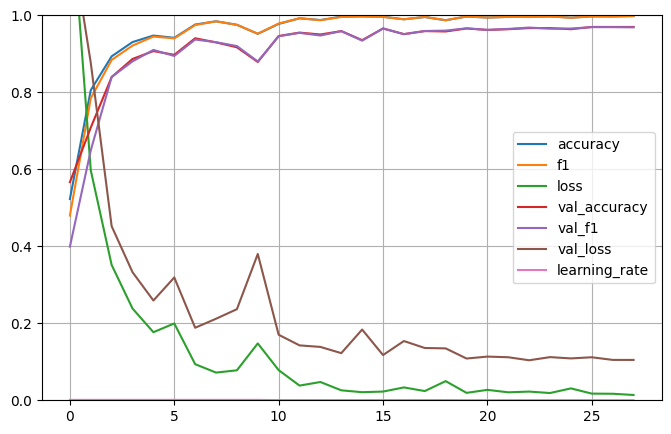

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.savefig("model_history.jpg")
plt.show()

In [ ]:
model.evaluate(val_ds, verbose=0)

[0.10393159836530685, 0.968090295791626, 0.9667319059371948]

In [ ]:
img_path = "/content/oral_cancer_2.jpg"
image = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
input_array = tf.keras.preprocessing.image.img_to_array(image)
input_array = np.expand_dims(input_array, axis=0)
input_array = input_array / 255.0
predictions = model.predict(input_array)
predicted_class_index = np.argmax(predictions)
predicted_class_name = classes_name[predicted_class_index]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


In [ ]:
predicted_class_name

'MC'

In [10]:

# Define the custom SqueezeExcite layer (same as in your original code)
class SqueezeExcite(layers.Layer):
    def __init__(self, ratio=16, **kwargs):
        super(SqueezeExcite, self).__init__(**kwargs)
        self.ratio = ratio

    def build(self, input_shape):
        filters = input_shape[-1]
        self.global_avg_pool = layers.GlobalAveragePooling2D()
        self.dense1 = layers.Dense(filters // self.ratio, activation='relu', use_bias=False)
        self.dense2 = layers.Dense(filters, activation='sigmoid', use_bias=False)
        self.reshape = layers.Reshape((1, 1, filters))

    def call(self, inputs, training=False):
        se = self.global_avg_pool(inputs)
        se = self.dense1(se)
        se = self.dense2(se)
        se = self.reshape(se)
        return layers.multiply([inputs, se])

# Load the model and register the custom layer
model = load_model('/content/densenet_model.keras', custom_objects={'SqueezeExcite': SqueezeExcite,
                                                                    'F1Score': F1Score})

# Check the model summary
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 8,007,287 (30.55 MB)

 Trainable params: 323,111 (1.23 MB)

 Non-trainable params: 7,037,952 (26.85 MB)

 Optimizer params: 646,224 (2.47 MB)

In [ ]:
model.evaluate(test_ds, verbose=1)


32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 451ms/step - accuracy: 0.9596 - f1: 0.9617 - loss: 0.1090


[0.12583035230636597, 0.9587425589561462, 0.9578844308853149]

In [13]:
y_pred, y_true = [], []
for images, labels in test_ds:  # Iterate through all batches in test_ds
    y_pred.extend(tf.argmax(model.predict(images), axis=1).numpy())  # Convert to numpy and flatten
    y_true.extend(tf.argmax(labels, axis=1).numpy())  # Convert to numpy and flatten



report = classification_report(y_true, y_pred, target_names=classes_name)
print("Classification Report: \n", report)


1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/ste

weighted cross entropy, premiuom processor , course andrew about adaptive learning rate

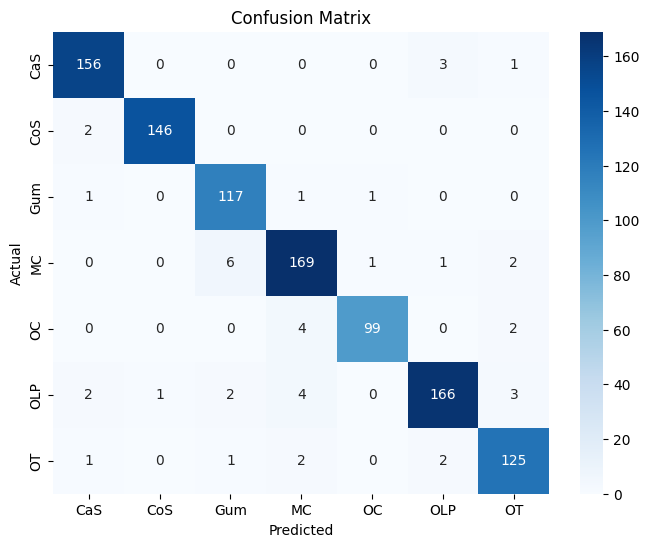

In [ ]:

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes_name, yticklabels=classes_name)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./logs


<IPython.core.display.Javascript object>

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


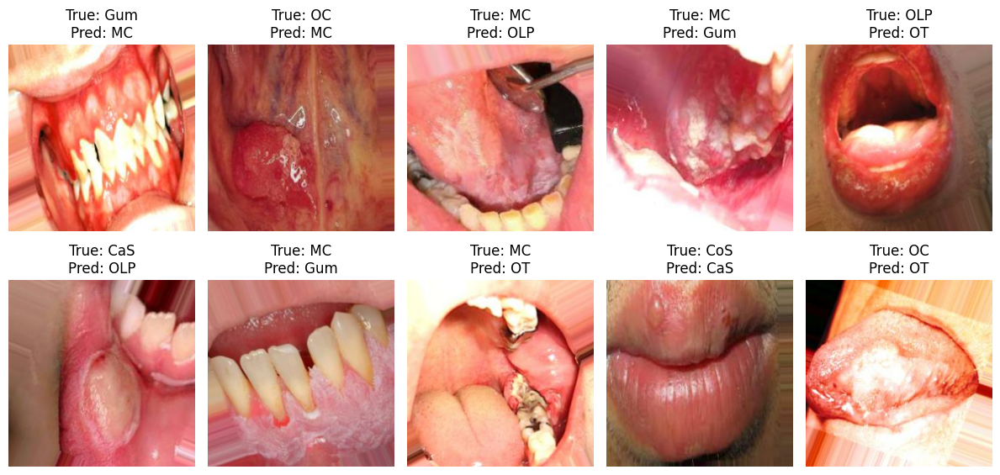

In [15]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Store misclassified indices
misclassified_images = []
misclassified_labels = []
misclassified_preds = []

# Convert lists to NumPy arrays
y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Iterate through the dataset again to get images
for images, labels in test_ds:
    batch_preds = tf.argmax(model.predict(images), axis=1).numpy()  # Predicted labels
    batch_true = tf.argmax(labels, axis=1).numpy()  # True labels

    for i in range(len(batch_true)):
        if batch_preds[i] != batch_true[i]:  # Misclassified sample
            misclassified_images.append(images[i].numpy())  # Convert to NumPy
            misclassified_labels.append(batch_true[i])
            misclassified_preds.append(batch_preds[i])

        if len(misclassified_images) >= 10:  # Stop after collecting 10 misclassified samples
            break
    if len(misclassified_images) >= 10:
        break

# Plot misclassified images
fig, axes = plt.subplots(2, 5, figsize=(12, 6))
axes = axes.flatten()

for i in range(10):
    img = misclassified_images[i]

    # If images are normalized (0-1), rescale to (0-255)
    if img.max() <= 1.0:
        img = (img * 255).astype(np.uint8)

    axes[i].imshow(img)  # Display image
    axes[i].axis("off")
    axes[i].set_title(f"True: {classes_name[misclassified_labels[i]]}\nPred: {classes_name[misclassified_preds[i]]}")

plt.tight_layout()
plt.show()
